# Final Project: Advanced Image Quilting

## CS445: Computational Photography - Spring 2022

## Jack Chen (zihengc2), 

In [1]:
# jupyter extension that allows reloading functions from imports without clearing kernel :D
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
# System imports
from os import path
import math

# Third-Party Imports
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata
import random
import glob

# Helper Imports
from utils import *

In [3]:
# modify to where you store your project data including utils
# datadir = "/content/drive/My Drive/proj4/" 
datadir = ''

samplesfn = datadir + "samples"
# !cp -r "$samplesfn" .

### Segmentation using K-means

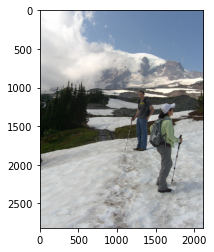

In [4]:
img = cv2.imread('samples/im2.JPG', cv2.COLOR_BGR2RGB)
width = img.shape[0]
height = img.shape[1]
Z = img.reshape((-1,3))
Z = np.float32(Z)  # convert to np.float32
plt.imshow(img[:, :, [2, 1, 0]])

(2816, 2112)
(3, 3)
[[200 201 201]
 [ 38  45  42]
 [159 144 131]]


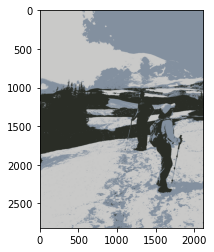

In [5]:
# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
K = 3
ret, label, center = cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)
label = label.flatten()
# Now convert back into uint8, and make original image
center = np.uint8(center)
res = center[label.flatten()]
res2 = res.reshape((img.shape))
label.resize(width, height)

# check outputs
print(label.shape)
print(center.shape)
print(center)
plt.figure()
plt.imshow(res2[:, :, [2, 1, 0]])
plt.show()

### Selecting best-fitting textures

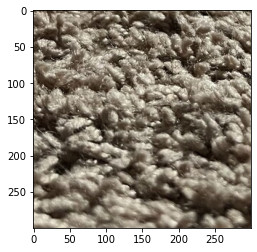

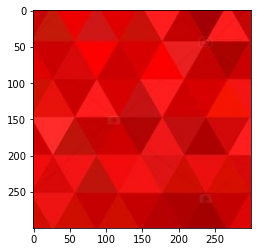

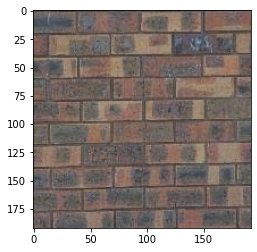

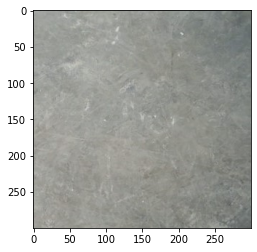

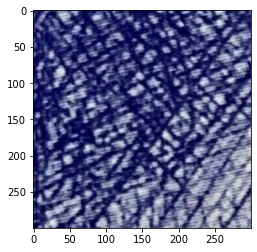

...

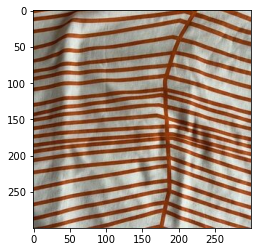

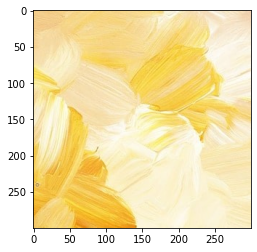

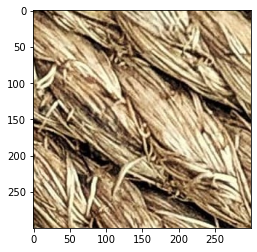

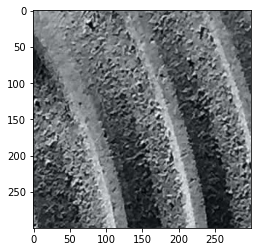

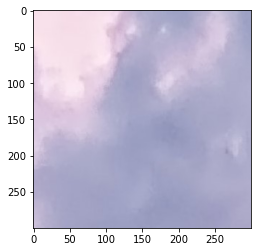

In [6]:
# Reading textures
textures = [cv2.imread(file) for file in glob.glob("textures/*.jpg")]
for texture in textures:
    plt.imshow(cv2.cvtColor(texture, cv2.COLOR_BGR2RGB))
    plt.show()

In [7]:
# Computes the average color of a texture
# https://www.delftstack.com/howto/python/opencv-average-color-of-image/
def compute_avg_color(textures):
    texture_colors_bgr = []
    for texture in textures:
        average_color_row = np.average(texture, axis=0)
        average_color = np.average(average_color_row, axis=0)
        texture_colors_bgr.append(average_color)
    return texture_colors_bgr

In [8]:
# Returns a texture filled with input color
def visualize_color(color_BGR):
    image = np.zeros((300 , 300, 3), np.uint8)
    image[:,:,:] = (color_BGR[0], color_BGR[1], color_BGR[2])
    return image

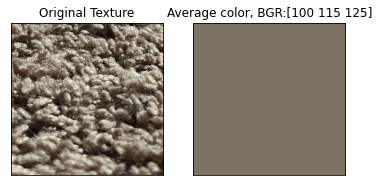

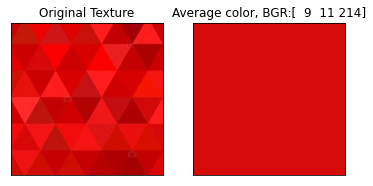

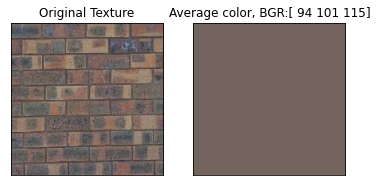

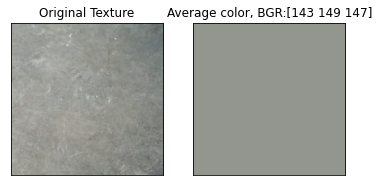

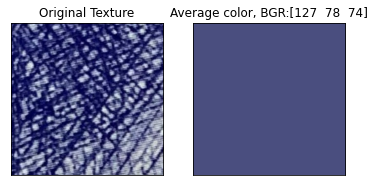

...

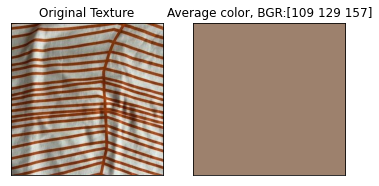

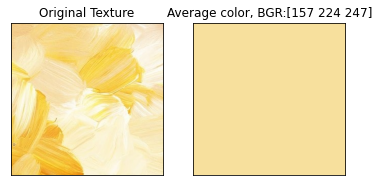

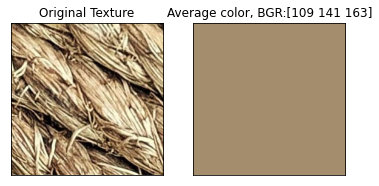

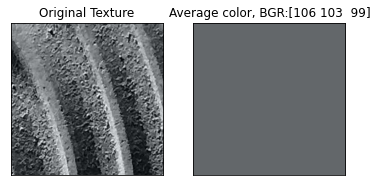

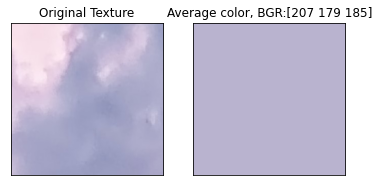

In [9]:
texture_colors_bgr = compute_avg_color(textures)

# Displaying textures and their computed average colors
for i in range(len(textures)):
    computed_color = visualize_color(texture_colors_bgr[i])
    
    fig, axes = plt.subplots(1, 2)
    axes[0].imshow(cv2.cvtColor(textures[i], cv2.COLOR_BGR2RGB))
    axes[0].set_title('Original Texture'), axes[0].set_xticks([]), axes[0].set_yticks([])
    axes[1].imshow(cv2.cvtColor(computed_color, cv2.COLOR_BGR2RGB))
    axes[1].set_title('Average color, BGR:'+ str(computed_color[0][0])), axes[1].set_xticks([]), axes[1].set_yticks([])

In [10]:
# Given a color, find the index of the texture in the texture array with closest color
# Finding the sum of the absolute difference between the red, green and blue numbers and choose the smallest one.
# https://stackoverflow.com/questions/54242194/python-find-the-closest-color-to-a-color-from-giving-list-of-colors
def color_to_texture_index(color, texture_colors):
    target_r = color[2]
    target_g = color[1]
    target_b = color[0]
    color_diffs = []
    for i in range(len(texture_colors)):
        r = texture_colors[i][2]
        g = texture_colors[i][1]
        b = texture_colors[i][0]
        color_diff = math.sqrt((r - target_r)**2 + (g - target_g)**2 + (b - target_b)**2)
        color_diffs.append((color_diff, i))
    s = set(color_diffs)
    return min(color_diffs)[1], sorted(s)[1][1] 

In [11]:
# PROBLEM: Sometimes chooses a wrong color since the only determining factor is euclidean distance
# Try to convert to other color spaces for more accurate comparison
def color_to_texture_index_YCrCb(color, texture_colors):
    color = cv2.cvtColor(color, cv2.COLOR_BGR2YCR_CB)
    target_Cr = color[1]
    target_Cb = color[2]
    color_diffs = []
    for i in range(len(texture_colors)):
        curr_color = cv2.cvtColor(texture_colors[i], cv2.COLOR_BGR2YCR_CB)
        Cr = curr_color[1]
        Cb = curr_color[2]
        color_diff = math.sqrt((Cr - target_Cr)**2 + (Cb - target_Cb)**2)
        color_diffs.append((color_diff, i))
    return min(color_diffs)[1]

[200 201 201]
8 16
[38 45 42]
10 9
[159 144 131]
3 12


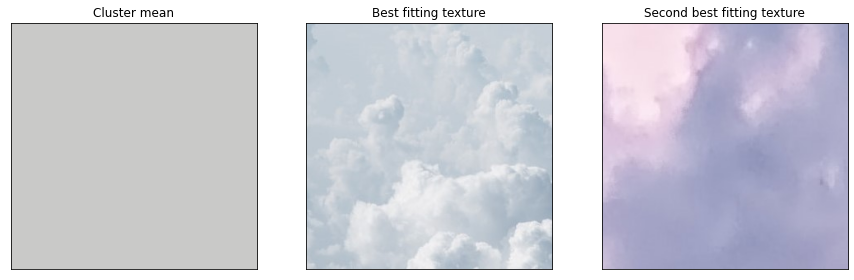

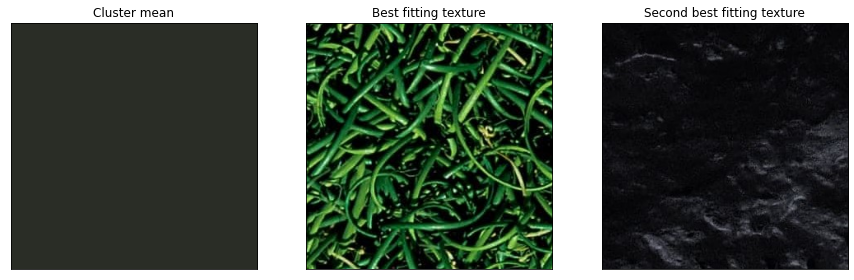

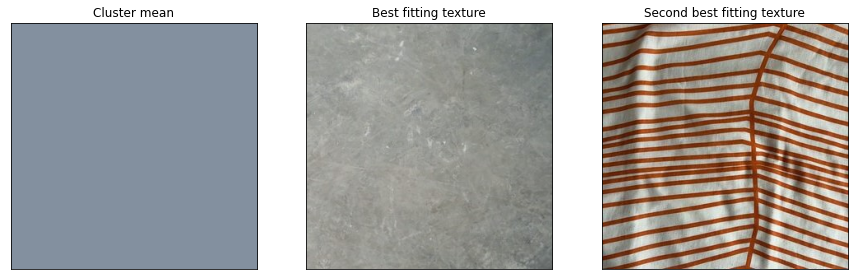

In [12]:
# Displaying target color, best choice, second choice
for i in range(3):
    first_color = center[i]
    print(first_color)
    color_block = visualize_color(first_color)
    texture_index, texture_index_2 = color_to_texture_index(first_color, texture_colors_bgr)
    print(texture_index, texture_index_2)
    
    fig, axes = plt.subplots(1, 3, figsize=(15,15))
    axes[0].imshow(cv2.cvtColor(color_block, cv2.COLOR_BGR2RGB))
    axes[0].set_title('Cluster mean'), axes[0].set_xticks([]), axes[0].set_yticks([])
    axes[1].imshow(cv2.cvtColor(textures[texture_index], cv2.COLOR_BGR2RGB))
    axes[1].set_title('Best fitting texture'), axes[1].set_xticks([]), axes[1].set_yticks([])
    axes[2].imshow(cv2.cvtColor(textures[texture_index_2], cv2.COLOR_BGR2RGB))
    axes[2].set_title('Second best fitting texture'), axes[2].set_xticks([]), axes[2].set_yticks([])

### Generate background images with textures

In [14]:
def choose_sample(cost_image, patch_size, tol):
    """
    :param cost_image: numpy.ndarry
    :param tol: float
    """
    radius = patch_size // 2
    candidates = []

    min = np.argsort(cost_image, None)

    for i in min:
        a, b = np.unravel_index(i, cost_image.shape)
        if cost_image.shape[0] - radius > a > radius and cost_image.shape[1] - radius > b > radius:
            candidates.append((a, b))
        if len(candidates) >= tol:
            break

        r = random.randint(0, tol - 1)
    return candidates[r]

In [15]:
def error(simple_overlap, sample_overlap):
    err = np.square(simple_overlap - sample_overlap)
    err = np.sum(err, axis=2)
    return err

In [16]:
def create_3D_mask(mask):
    x, y = mask.shape
    new_mask = np.zeros((x, y, 3), dtype=np.float64)
    for i in range(x):
        for j in range(y):
            if mask[i, j] == 1:
                new_mask[i, j, :] = 1
            else:
                new_mask[i, j, :] = 0
    return new_mask

In [17]:
def mask_vertical(output, sample, x, y, u, v):
    simple_overlap = output[x:x+patch_size, y:y+overlap]
    sample_overlap = sample[u:u+patch_size, v:v+overlap]
    err_patch = error(simple_overlap, sample_overlap)
    mask = cut(err_patch.T).T
    mask = create_3D_mask(mask)
    seam = sample_overlap * mask + simple_overlap * (1 - mask)
    output[x:x+patch_size, y:y+patch_size] = sample[u:u+patch_size, v:v+patch_size]
    output[x:x+patch_size, y:y+overlap] = seam
def mask_horizontal(output, sample, x, y, u, v):
    simple_overlap = output[x:x+overlap, y:y+patch_size]
    sample_overlap = sample[u:u+overlap, v:v+patch_size]
    err_patch = error(simple_overlap, sample_overlap)
    mask = cut(err_patch)
    mask = create_3D_mask(mask)
    seam = sample_overlap * mask + simple_overlap * (1 - mask)
    output[x:x+patch_size, y:y+patch_size] = sample[u:u+patch_size, v:v+patch_size]
    output[x:x+overlap, y:y+patch_size] = seam
def mask_else(output, sample, x, y, u, v):
    simple_overlap = output[x:x+patch_size, y:y+overlap]
    sample_overlap = sample[u:u+patch_size, v:v+overlap]
    err_patch = error(simple_overlap, sample_overlap)
    mask1 = cut(err_patch.T).T
    mask1_sqr = np.ones((patch_size,patch_size), dtype = "int") 
    h, w = mask1.shape
    for c in range(h):
        for d in range(w):
            if mask1[c,d] == 1:
                mask1_sqr[c,d] = 1                               
            else:
                mask1_sqr[c,d] = 0
    simple_overlap = output[x:x+overlap, y:y+patch_size]
    sample_overlap = sample[u:u+overlap, v:v+patch_size]
    err_patch = error(simple_overlap, sample_overlap)
    mask2 = cut(err_patch)
    mask2_sqr = np.ones((patch_size,patch_size), dtype = "int")
    h, w = mask2.shape
    for c in range(h):
        for d in range(w):
            if mask2[c,d] == 1:
                mask2_sqr[c,d] = 1                               
            else:
                mask2_sqr[c,d] = 0
    mask = np.logical_and(mask1_sqr,mask2_sqr)
    mask = create_3D_mask(mask)
    temp = output[x:x+patch_size,y:y+patch_size]
    seam = mask * sample[u:u+patch_size, v:v+patch_size] + (1 - mask) * temp
    output[x:x+patch_size, y:y+patch_size] = seam

In [18]:
def quilt_cut(sample, out_size, patch_size, overlap, tol):
    """
    Samples square patches of size patchsize from sample using seam finding in order t
    Feel free to add function parameters
    :param sample: numpy.ndarray
    :param out_size: int
    :param patch_size: int
    :param overlap: int
    :param tol: float
    :return: numpy.ndarray
    """
    output = np.zeros((out_size, out_size, 3), dtype=np.float64)
    fill_size = patch_size - overlap
    num_sqr = (out_size - patch_size) // fill_size
    radius = patch_size // 2
    # randomly pick the first patch
    num_pick = sample.shape[0] - patch_size     # randomly pick from the sample within
    # r = (int)(random.random()*num_pick)         # randomly choose the first patch
    r = 0
    patch = output[0:patch_size, 0:patch_size]  # waiting to be iterated
    output[0:patch_size, 0:patch_size] = sample[r:r+patch_size, r:r+patch_size]
    for i in range(num_sqr):
        for j in range(num_sqr):
            mask = np.zeros((patch_size, patch_size, 3), dtype=np.float64)
            # compute mask
            if (i == 0) and (j == 0):
                continue
            if i == 0:
                mask[:, :overlap, :] = 1
            elif j == 0:
                mask[:overlap, :, :] = 1
            else:
                mask[:, :overlap, :] = 1
                mask[:overlap, :, :] = 1
            x = i * fill_size
            y = j * fill_size
            mask = mask[:,:,0]
            template = output[x:x+patch_size, y:y+patch_size]
            cost_image = ssd_patch(mask, template, sample, patch_size)
            a, b = choose_sample(cost_image, patch_size, tol)
            u = a - radius
            v = b - radius 
            if i == 0 and j != 0:
                mask_vertical(output, sample, x, y, u, v)
            elif j == 0 and i != 0:
                mask_horizontal(output, sample, x, y, u, v)
            elif i != 0 and j != 0:
                mask_else(output, sample, x, y, u, v)
    output /= 255
    return output

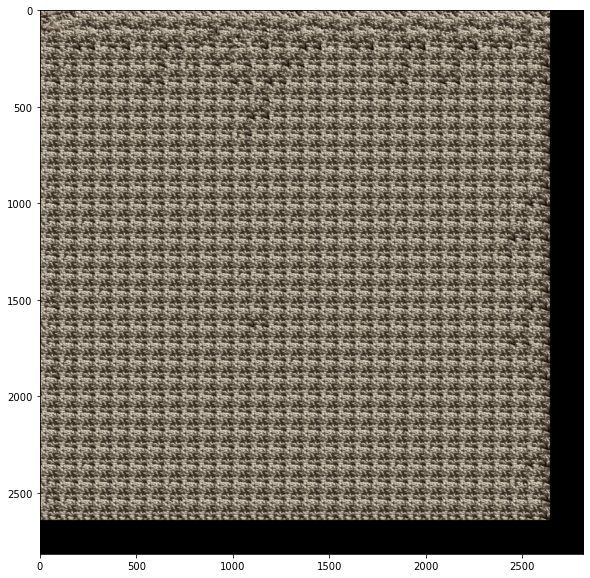

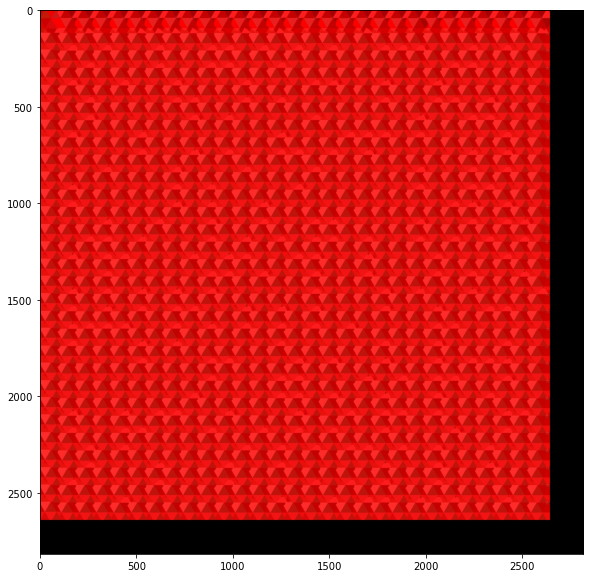

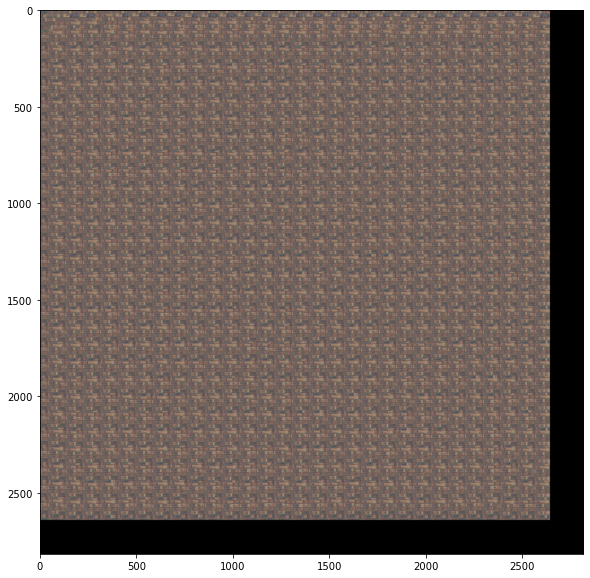

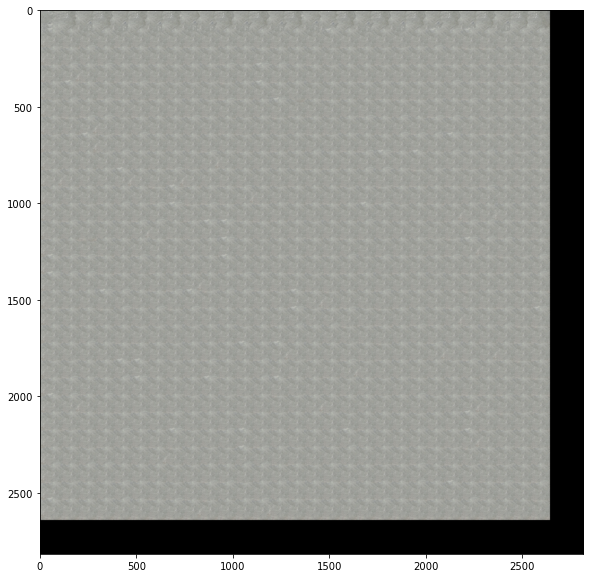

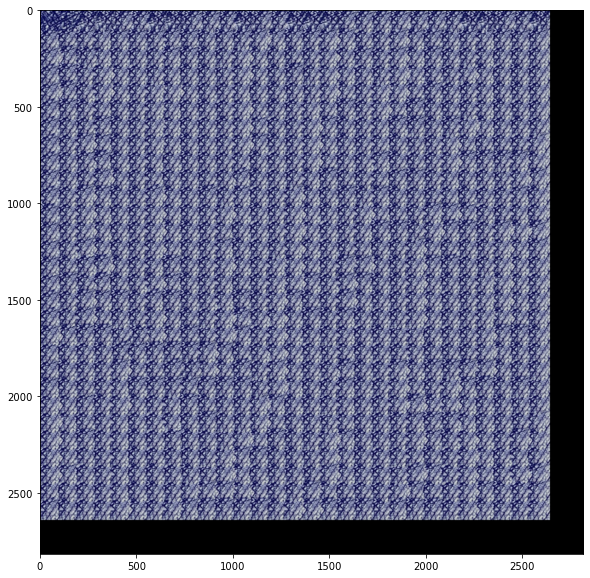

...

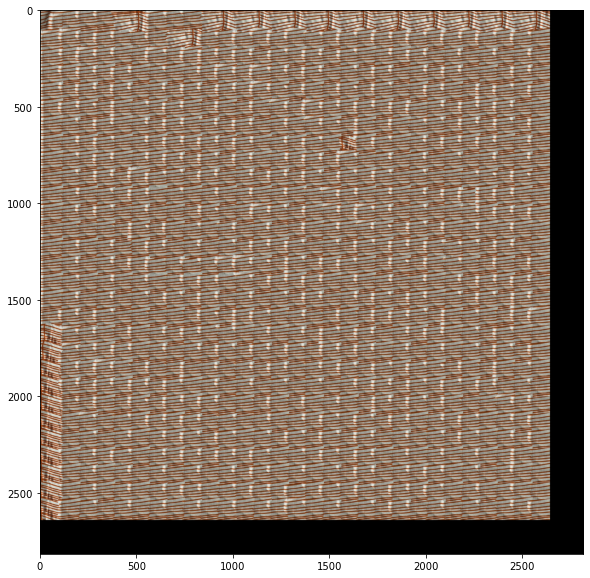

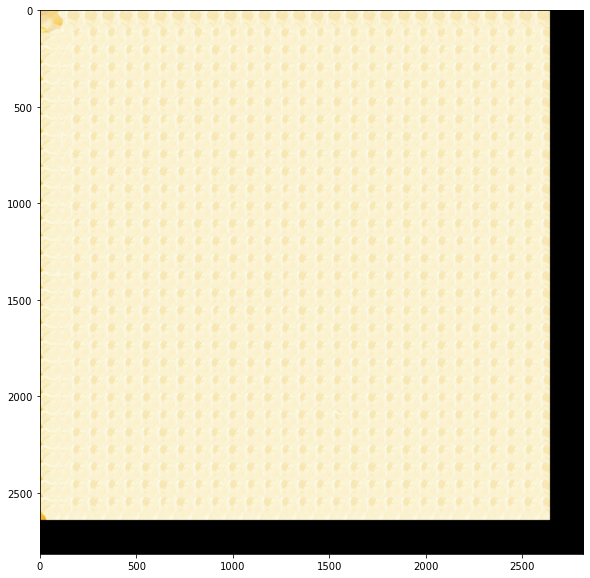

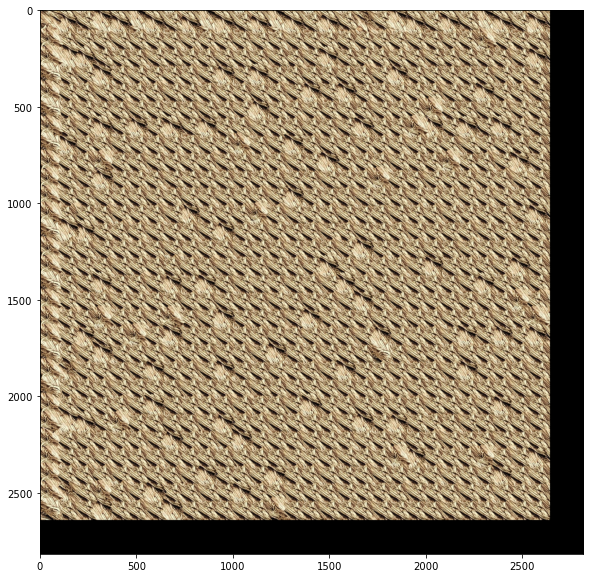

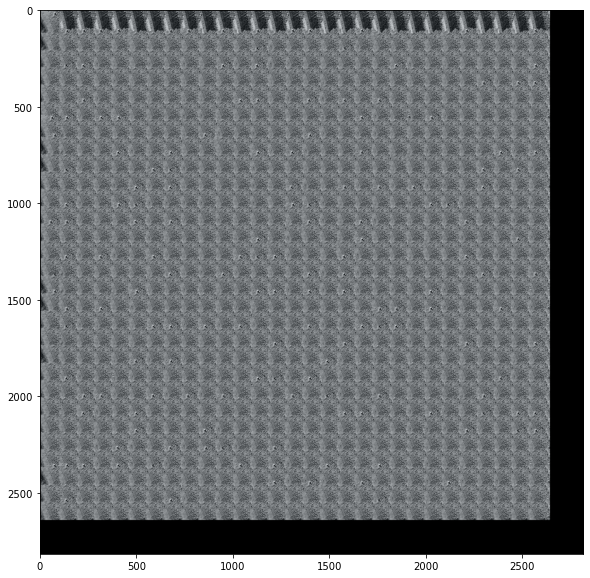

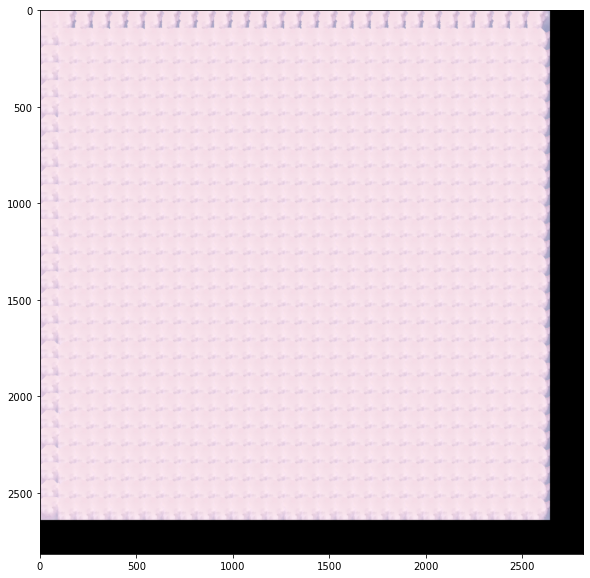

In [19]:
out_size = max(width, height)
patch_size = 120
overlap = 10
tol = 10

backgrounds_seam = []
for i in range(len(textures)):
    curr_texture = cv2.cvtColor(textures[i], cv2.COLOR_BGR2RGB)
    res = quilt_cut(curr_texture, out_size, patch_size, overlap, tol)

    if res is not None:
        plt.figure(figsize=(10,10))
        plt.imshow(res)
        backgrounds_seam.append(res)
        write_image(backgrounds_seam[i], 'generated_seam_copy/'+str(i) +'_.png')

### Apply texture based on K-means

In [20]:
def getSegement(labels, labelIndex):
    indices = np.where(labels==labelIndex, labels, -1)
    return indices

In [21]:
def getMask(input):
    mask = input.copy()
    mask[mask != -1] = 1
    mask[mask == -1] = 0
    mask3d = np.zeros((mask.shape[0], mask.shape[1], 3))
    for i in range(3):
        mask3d[:, :, i] = mask
    return mask3d

In [22]:
def blend(texture, input_im, mask):
    im = input_im.copy()
    output = mask * texture + (1-mask) * im
    return output

In [23]:
def blendAll(textures, label):
    input_im = np.zeros((width, height, 3))
    masks = []
    for i in range(3):
        layer = getSegement(label, i)
        masks.append(getMask(layer))
        output_im = blend(textures[i], input_im, masks[i])
        input_im = output_im

In [24]:
selected_textures = np.zeros((K, width, height, 3))
blue = cv2.imread('samples/blue.jpg', cv2.COLOR_BGR2RGB)
selected_textures[0] = blue
red = cv2.imread('samples/red.jpg', cv2.COLOR_BGR2RGB)
selected_textures[1] = red
green = cv2.imread('samples/green.jpg', cv2.COLOR_BGR2RGB)
selected_textures[2] = green

input_im = res2

masks = []
for i in range(3):
    layer = getSegement(label, i)
    masks.append(getMask(layer))
    output_im = blend(textures[i], input_im, masks[i])
    input_im = output_im

ValueError: operands could not be broadcast together with shapes (2816,2112,3) (300,300,3) 

In [ ]:
# change to unit8 to present original color
plt.imshow(np.uint8(input_im)[:, :, [2, 1, 0]])

In [ ]:
# textures = np.zeros((K, width, height, 3))
# background_1 = cv2.imread('generated_simple/3.png', cv2.COLOR_BGR2RGB)
# textures[0] = background_1[0:width, 0:height, :]
# background_2 = cv2.imread('generated_simple/0.png', cv2.COLOR_BGR2RGB)
# textures[1] = background_2[0:width, 0:height, :]
# background_3 = cv2.imread('generated_simple/5.png', cv2.COLOR_BGR2RGB)
# textures[2] = background_3[0:width, 0:height, :]

textures = np.zeros((K, width, height, 3))
background_1 = cv2.imread('generated_seam/8_.png', cv2.COLOR_BGR2RGB)
textures[0] = background_1[0:width, 0:height, :]
background_2 = cv2.imread('generated_seam/9_.png', cv2.COLOR_BGR2RGB)
textures[1] = background_2[0:width, 0:height, :]
background_3 = cv2.imread('generated_seam/3_.png', cv2.COLOR_BGR2RGB)
textures[2] = background_3[0:width, 0:height, :]

input_im = res2

masks = []
for i in range(3):
    layer = getSegement(label, i)
    masks.append(getMask(layer))
    output_im = blend(textures[i], input_im, masks[i])
    input_im = output_im

In [ ]:
# change to unit8 to present original color
plt.figure(figsize = (16,9))
plt.imshow(np.uint8(input_im)[:, :, [2, 1, 0]])

In [ ]:
# out = cv2.bitwise_and(textures[0], masks[0])
# # plt.imshow(masks[0])
# plt.imshow(out)
# result[mask == 0] = textures[0] # Optional
# plt.imshow(result)